# Лабораторная работа №3. Обучение нейросетевых моделей классификации изображений
Пан Анатолий Эдуардович<br>
Группа 932209<br>
Вариант 9

Импорт необходимых модулей и библиотек

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from keras.optimizers import Adam

Загрузка набора данных

In [ ]:
# Install kaggle
!pip install -q kaggle

In [ ]:
# Connect to Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Change directory
import os
os.chdir("/content/drive/MyDrive/masters/Neural_networks/lab_2")

In [ ]:
# Create a kaggle folder
!mkdir -p ~/.kaggle

# Copy kaggle.json to created folder
!cp kaggle.json ~/.kaggle/

In [ ]:
os.chdir("/content")

In [ ]:
# Permission for the json to act
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# Download the required dataset
!kaggle datasets download -d emmarex/plantdisease

 97% 640M/658M [00:04<00:00, 207MB/s]
100% 658M/658M [00:04<00:00, 148MB/s]


In [ ]:
# Unzip our dataset
from zipfile import ZipFile
from tqdm import tqdm


file_to_extract = "plantdisease.zip"

# Open your .zip file
with ZipFile(file=file_to_extract) as zip_file:

    # Loop over each file and extract them
    for file in tqdm(iterable=zip_file.namelist(), total=len(zip_file.namelist())):
        zip_file.extract(member=file)

100%|██████████| 41278/41278 [00:19<00:00, 2118.82it/s]


## Бинарный классификатор
* Класс 0: Tomato_healthy,
* Класс 1: Tomato_Septoria_Leaf_spot

Путь к данным

In [ ]:
data_dir = "/content/plantvillage/PlantVillage"

Используем только заданные по условию классы

In [ ]:
os.makedirs(os.path.join("/content/binary", "Tomato_healthy"), exist_ok=True)
os.makedirs(os.path.join("/content/binary", "Tomato_Septoria_leaf_spot"), exist_ok=True)

In [ ]:
import shutil
import random

In [ ]:
source_dir = os.path.join(data_dir, "Tomato_healthy")
for filename in os.listdir(source_dir):
    source_file = os.path.join(source_dir, filename)
    destination_file = os.path.join("/content/binary/Tomato_healthy", filename)
    shutil.copy(source_file, destination_file)

source_dir = os.path.join(data_dir, "Tomato_Septoria_leaf_spot")
for filename in os.listdir(source_dir):
    source_file = os.path.join(source_dir, filename)
    destination_file = os.path.join("/content/binary/Tomato_Septoria_leaf_spot", filename)
    shutil.copy(source_file, destination_file)

Разделим выборку на train, val, test

In [ ]:
!pip install split-folders -q

In [ ]:
import splitfolders

In [ ]:
file_path = "/content/binary"
splitfolders.ratio(file_path, output="./out",
                   seed=333,
                   ratio=(0.6, 0.2, 0.2))

Copying files: 3362 files [00:00, 4660.14 files/s]


Пути к выборкам

In [ ]:
train_dir = "/content/out/train"
val_dir = "/content/out/val"
test_dir = "/content/out/test"

### Предобработка изображений

- Создаем объекты ImageDataGenerator, а также масштабируем изображение так, чтобы значения их пикселей были нормализованы между 0 и 1.
-  Загружаем изображения из какалога тестовой и валидационной выборки, размер изменен до 150х150px.
- Размер батча - количество образцов, которые будут распространяться по сети в данный момент времени

In [ ]:
tr_gen = ImageDataGenerator(rescale=1/255.0)
v_gen = ImageDataGenerator(rescale=1/255.0)
t_gen = ImageDataGenerator(rescale=1/255.0)

# Load and iterate train dataset
train_ds = tr_gen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=32,
        class_mode='binary',
        classes=['Tomato_healthy', 'Tomato_Septoria_leaf_spot'],
        shuffle=True,
        seed=42)

# Load and iterate validation dataset
val_ds = v_gen.flow_from_directory(val_dir,
                                   class_mode='binary',
                                   target_size=(150, 150),
                                   batch_size=32,
                                   classes=['Tomato_healthy', 'Tomato_Septoria_leaf_spot'],
                                   shuffle=True,
                                   seed=42)
# Load and iterate test dataset
test_ds = t_gen.flow_from_directory(test_dir,
                                    class_mode='binary',
                                    target_size=(150, 150),
                                    batch_size=32,
                                    classes=['Tomato_healthy', 'Tomato_Septoria_leaf_spot'],
                                    shuffle=True,
                                    seed=42)

Found 2016 images belonging to 2 classes.
Found 672 images belonging to 2 classes.
Found 674 images belonging to 2 classes.


Отобразим несколько изображений для того, чтобы убедиться в верности загрузки данных

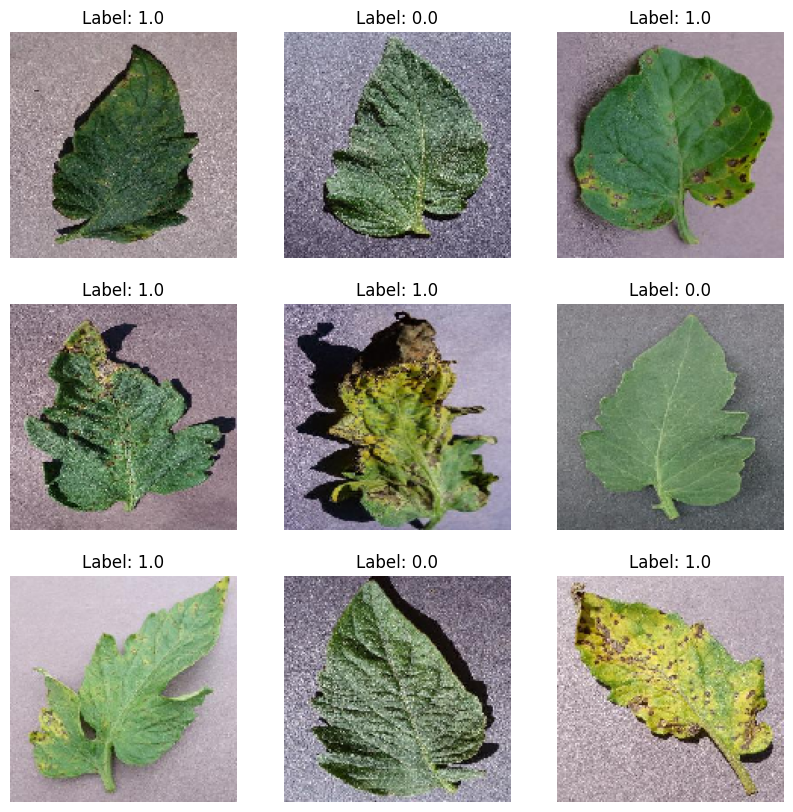

In [ ]:
# Load a few images from the test dataset
test_images, test_labels = next(test_ds)

# Display 9 images
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(test_images[i])
    plt.title(f"Label: {test_labels[i]}")
    plt.axis("off")
plt.show()


### Создадим нейросеть

Начнем с рассмотрения сверточной нейронной сети, т.к. она лучше всего подходит для классификации изображений

#### CNN

In [ ]:
model_cnn = Sequential()

model_cnn.add(Conv2D(4, (3, 3), activation='relu', input_shape=(150, 150, 3)))
model_cnn.add(MaxPooling2D((2, 2)))

model_cnn.add(Conv2D(8, (3, 3), activation='relu'))
model_cnn.add(MaxPooling2D((2, 2)))

model_cnn.add(Conv2D(8, (3, 3), activation='relu'))
model_cnn.add(MaxPooling2D((2, 2)))

model_cnn.add(Conv2D(8, (3, 3), activation='relu'))
model_cnn.add(MaxPooling2D((2, 2)))

model_cnn.add(Flatten())
model_cnn.add(Dense(16, activation='relu'))
model_cnn.add(Dense(1, activation='sigmoid'))

In [ ]:
model_cnn.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
model_cnn.summary()

Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_70 (Conv2D)          (None, 148, 148, 4)       112       
                                                                 
 max_pooling2d_70 (MaxPooli  (None, 74, 74, 4)         0         
 ng2D)                                                           
                                                                 
 conv2d_71 (Conv2D)          (None, 72, 72, 8)         296       
                                                                 
 max_pooling2d_71 (MaxPooli  (None, 36, 36, 8)         0         
 ng2D)                                                           
                                                                 
 conv2d_72 (Conv2D)          (None, 34, 34, 8)         584       
                                                                 
 max_pooling2d_72 (MaxPooli  (None, 17, 17, 8)       

Сохранение наилучшей модели. Если не будет никаких изменений валидационной точности в течении 10 эпох, то остановим обучение

In [ ]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

In [ ]:
early_stop = EarlyStopping(monitor='val_accuracy',
                           patience=10,
                           mode='max',
                           verbose=1
                           )
checkpoint = ModelCheckpoint('binary_cnn_best.hdf5',
                             monitor='val_accuracy',
                             verbose=1,
                             mode='max',
                             save_best_only=True
                             )

callbacks_list=[early_stop, checkpoint]

Запустим обучение на 100 эпох с запасом, т.к. модель остановится раньше

In [ ]:
epochs = 100
history = model_cnn.fit(train_ds,
                    validation_data=val_ds,
                    epochs=epochs,
                    callbacks=callbacks_list)

Epoch 1/100
63/63 [==============================] - ETA: 0s - loss: 0.5816 - accuracy: 0.7351
Epoch 1: val_accuracy improved from -inf to 0.79762, saving model to binary_cnn_best.hdf5
63/63 [==============================] - 6s 74ms/step - loss: 0.5816 - accuracy: 0.7351 - val_loss: 0.3794 - val_accuracy: 0.7976
Epoch 2/100
63/63 [==============================] - ETA: 0s - loss: 0.2906 - accuracy: 0.8849
Epoch 2: val_accuracy improved from 0.79762 to 0.91667, saving model to binary_cnn_best.hdf5
63/63 [==============================] - 5s 83ms/step - loss: 0.2906 - accuracy: 0.8849 - val_loss: 0.2105 - val_accuracy: 0.9167
Epoch 3/100
63/63 [==============================] - ETA: 0s - loss: 0.2097 - accuracy: 0.9246
Epoch 3: val_accuracy improved from 0.91667 to 0.93155, saving model to binary_cnn_best.hdf5
63/63 [==============================] - 4s 59ms/step - loss: 0.2097 - accuracy: 0.9246 - val_loss: 0.1903 - val_accuracy: 0.9315
Epoch 4/100
63/63 [==============================

Визуализируем результаты

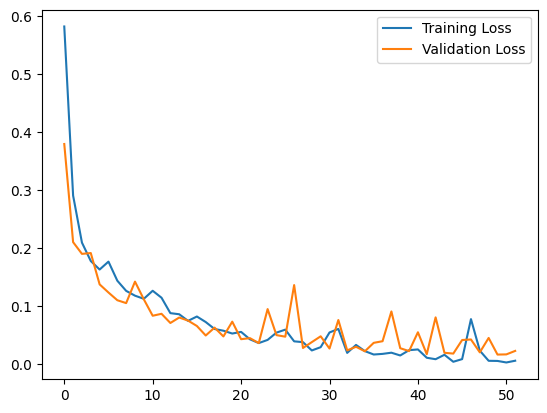

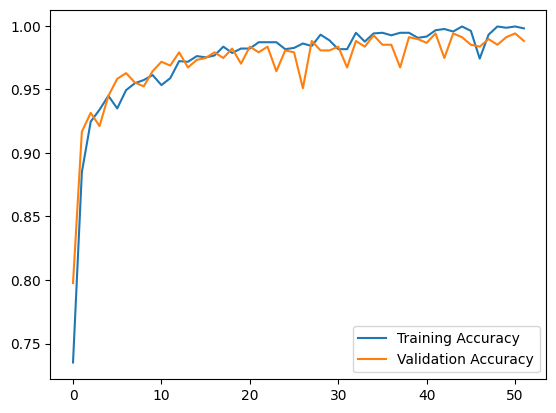

In [ ]:
# График функции потерь
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()

# График точности
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.show()

Загрузим наилучшую модель

In [ ]:
model_cnn.load_weights("binary_cnn_best.hdf5")

Делаем предсказание

1/1 [==============================] - 0s 294ms/step


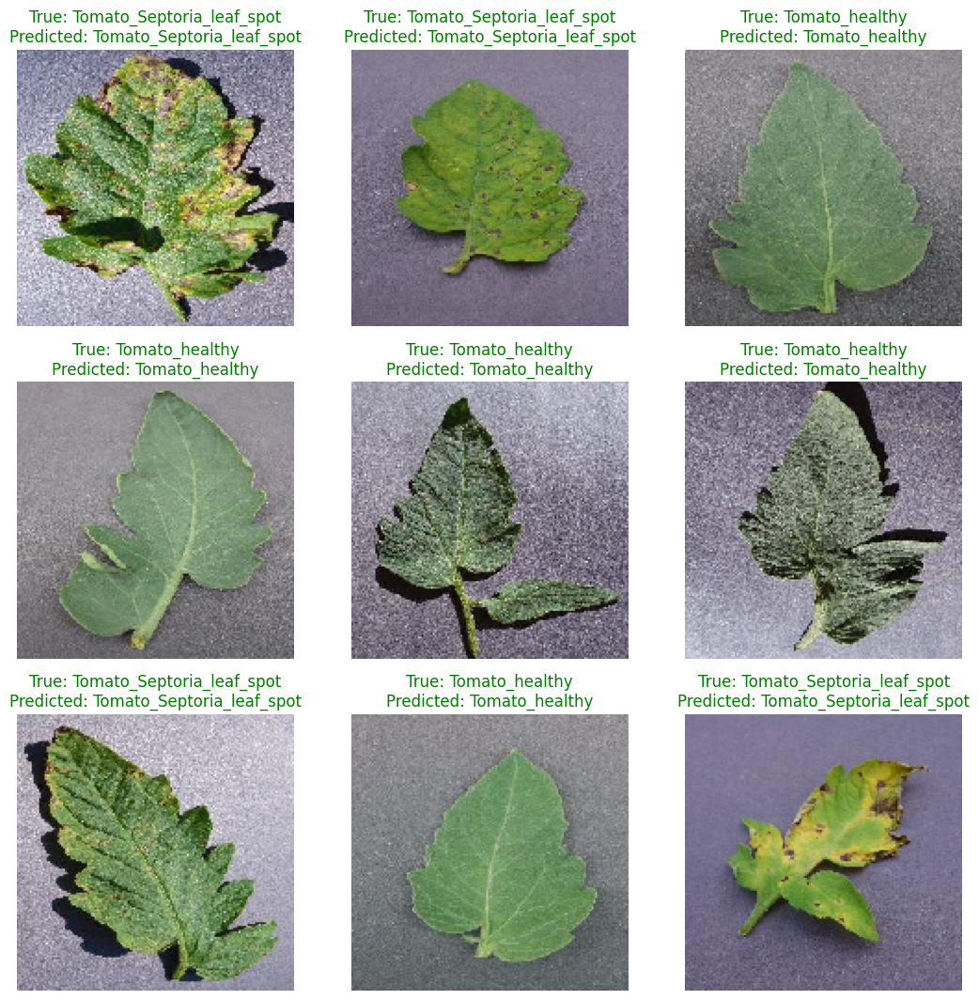

In [ ]:
# Получаем изображения и метки из тестового набора
test_images, test_labels = next(test_ds)

# Предсказываем метки для изображений с использованием лучшей модели
predictions = model_cnn.predict(test_images)

# Отображаем первые 9 изображений
plt.figure(figsize=(13, 13))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(test_images[i])
    true_label = 'Tomato_healthy' if test_labels[i] == 0 else 'Tomato_Septoria_leaf_spot'
    predicted_label = 'Tomato_healthy' if predictions[i] < 0.5 else 'Tomato_Septoria_leaf_spot'
    text_color = 'green' if true_label == predicted_label else 'red'
    plt.title(f'True: {true_label}\nPredicted: {predicted_label}', color=text_color)
    plt.axis('off')

plt.show()

#### Полносвязная нейронная сеть

CNN показывает очень хорошие результаты, что одновременно хорошо и странно. Я решил проверить как будет вести себя полносвязная нейронная сеть для бинарной классификации того же самого набора данных

In [ ]:
model = Sequential()

model.add(Flatten(input_shape=(150, 150, 3)))
model.add(Dense(256, activation='relu'))
model.add(Dense(512, activation='relu'))
# model.add(Dropout(0.5))
# model.add(Dense(128, activation='relu')) #
# model.add(Dense(64, activation='relu'))#
# model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

In [ ]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_5 (Flatten)         (None, 67500)             0         
                                                                 
 dense_15 (Dense)            (None, 256)               17280256  
                                                                 
 dense_16 (Dense)            (None, 512)               131584    
                                                                 
 dense_17 (Dense)            (None, 1)                 513       
                                                                 
Total params: 17412353 (66.42 MB)
Trainable params: 17412353 (66.42 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Для если не будет никаких изменений валидационной точности в течении 10 эпох, то остановим обучение

In [ ]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

In [ ]:
early_stop = EarlyStopping(monitor='val_accuracy',
                           patience=10,
                           mode='max',
                           verbose=1
                           )
checkpoint = ModelCheckpoint('binary_fully_best.hdf5',
                             monitor='val_accuracy',
                             verbose=1,
                             mode='max',
                             save_best_only=True
                             )

callbacks_list=[early_stop, checkpoint]

In [ ]:
epochs = 100
history = model.fit(train_ds,
                    validation_data=val_ds,
                    epochs=epochs,
                    callbacks=callbacks_list)

Epoch 1/100
63/63 [==============================] - ETA: 0s - loss: 2.8127 - accuracy: 0.6230
Epoch 1: val_accuracy improved from -inf to 0.68452, saving model to binary_fully_best.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


63/63 [==============================] - 16s 235ms/step - loss: 2.8127 - accuracy: 0.6230 - val_loss: 0.8746 - val_accuracy: 0.6845
Epoch 2/100
63/63 [==============================] - ETA: 0s - loss: 0.3484 - accuracy: 0.8547
Epoch 2: val_accuracy improved from 0.68452 to 0.72768, saving model to binary_fully_best.hdf5
63/63 [==============================] - 14s 217ms/step - loss: 0.3484 - accuracy: 0.8547 - val_loss: 0.7233 - val_accuracy: 0.7277
Epoch 3/100
63/63 [==============================] - ETA: 0s - loss: 0.4420 - accuracy: 0.8224
Epoch 3: val_accuracy improved from 0.72768 to 0.85714, saving model to binary_fully_best.hdf5
63/63 [==============================] - 14s 227ms/step - loss: 0.4420 - accuracy: 0.8224 - val_loss: 0.3457 - val_accuracy: 0.8571
Epoch 4/100
63/63 [==============================] - ETA: 0s - loss: 0.2305 - accuracy: 0.9067
Epoch 4: val_accuracy improved from 0.85714 to 0.90327, saving model to binary_fully_best.hdf5
63/63 [===========================

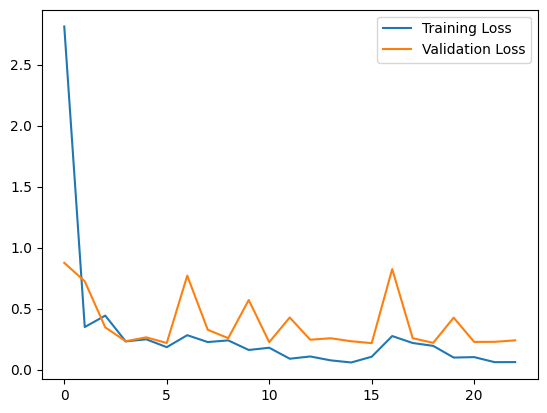

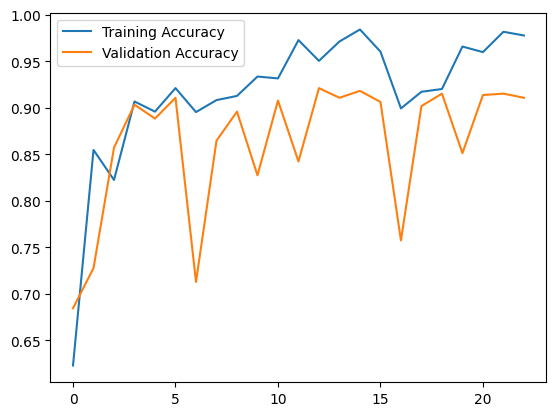

In [ ]:
# График функции потерь
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()

# График точности
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.show()

In [ ]:
model.load_weights("binary_fully_best.hdf5")

1/1 [==============================] - 0s 61ms/step


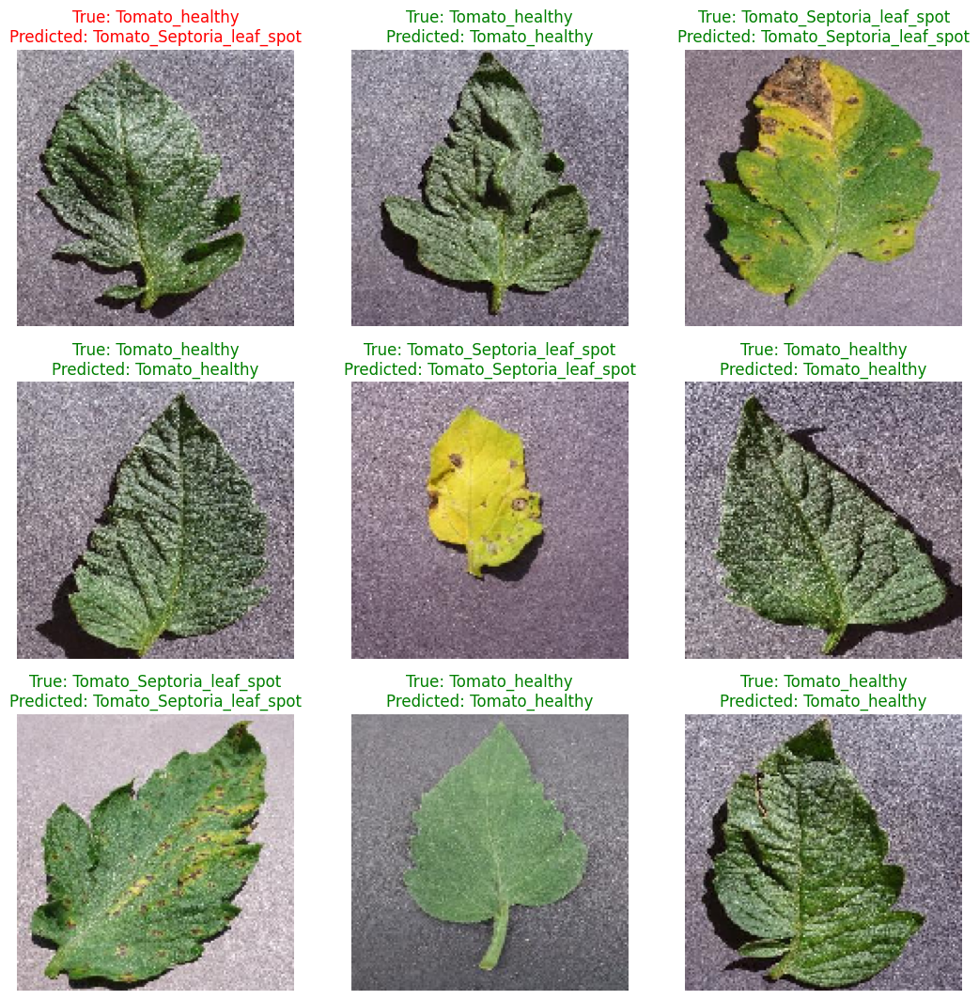

In [ ]:
# Получаем изображения и метки из тестового набора
test_images, test_labels = next(test_ds)

# Предсказываем метки для изображений с использованием лучшей модели
predictions = model.predict(test_images)

# Отображаем первые 9 изображений
plt.figure(figsize=(13, 13))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(test_images[i])
    true_label = 'Tomato_healthy' if test_labels[i] == 0 else 'Tomato_Septoria_leaf_spot'
    predicted_label = 'Tomato_healthy' if predictions[i] < 0.5 else 'Tomato_Septoria_leaf_spot'
    text_color = 'green' if true_label == predicted_label else 'red'
    plt.title(f'True: {true_label}\nPredicted: {predicted_label}', color=text_color)
    plt.axis('off')

plt.show()

Полносвязная нейросеть показывает результат чуть хуже чем CNN, примерно 91% точности. Но этого вполне достаточно. Попробуем добавить в нее dropout

#### Добавим dropout в полносвязную нейросеть

In [ ]:
model_fully_drop = Sequential()

model_fully_drop.add(Flatten(input_shape=(150, 150, 3)))
model_fully_drop.add(Dense(256, activation='relu'))
model_fully_drop.add(Dropout(0.3))
model_fully_drop.add(Dense(512, activation='relu'))
model_fully_drop.add(Dropout(0.3))
model_fully_drop.add(Dense(1, activation='sigmoid'))

In [ ]:
model_fully_drop.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
model_fully_drop.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_7 (Flatten)         (None, 67500)             0         
                                                                 
 dense_21 (Dense)            (None, 256)               17280256  
                                                                 
 dropout_7 (Dropout)         (None, 256)               0         
                                                                 
 dense_22 (Dense)            (None, 512)               131584    
                                                                 
 dropout_8 (Dropout)         (None, 512)               0         
                                                                 
 dense_23 (Dense)            (None, 1)                 513       
                                                                 
Total params: 17412353 (66.42 MB)
Trainable params: 17

Для если не будет никаких изменений валидационной точности в течении 10 эпох, то остановим обучение

In [ ]:
early_stop = EarlyStopping(monitor='val_accuracy',
                           patience=10,
                           mode='max',
                           verbose=1
                           )
checkpoint = ModelCheckpoint('binary_fully_dropout_best.hdf5',
                             monitor='val_accuracy',
                             verbose=1,
                             mode='max',
                             save_best_only=True
                             )

callbacks_list=[early_stop, checkpoint]

In [ ]:
epochs = 100
history = model_fully_drop.fit(train_ds,
                    validation_data=val_ds,
                    epochs=epochs,
                    callbacks=callbacks_list)

Epoch 1/100
63/63 [==============================] - ETA: 0s - loss: 3.5062 - accuracy: 0.5749
Epoch 1: val_accuracy improved from -inf to 0.80804, saving model to binary_fully_dropout_best.hdf5
63/63 [==============================] - 14s 209ms/step - loss: 3.5062 - accuracy: 0.5749 - val_loss: 0.4618 - val_accuracy: 0.8080
Epoch 2/100
63/63 [==============================] - ETA: 0s - loss: 0.5707 - accuracy: 0.7044
Epoch 2: val_accuracy improved from 0.80804 to 0.85714, saving model to binary_fully_dropout_best.hdf5
63/63 [==============================] - 13s 205ms/step - loss: 0.5707 - accuracy: 0.7044 - val_loss: 0.4612 - val_accuracy: 0.8571
Epoch 3/100
63/63 [==============================] - ETA: 0s - loss: 0.5439 - accuracy: 0.7128
Epoch 3: val_accuracy did not improve from 0.85714
63/63 [==============================] - 13s 210ms/step - loss: 0.5439 - accuracy: 0.7128 - val_loss: 0.5042 - val_accuracy: 0.7991
Epoch 4/100
63/63 [==============================] - ETA: 0s - lo

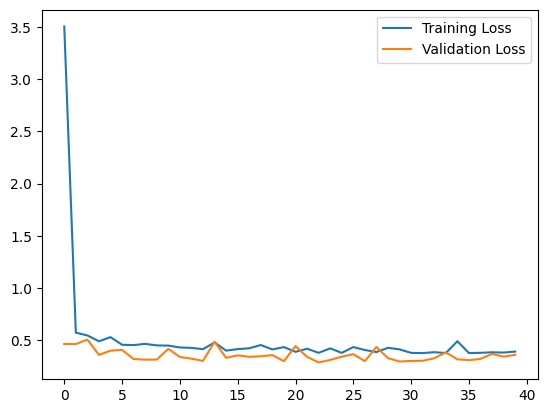

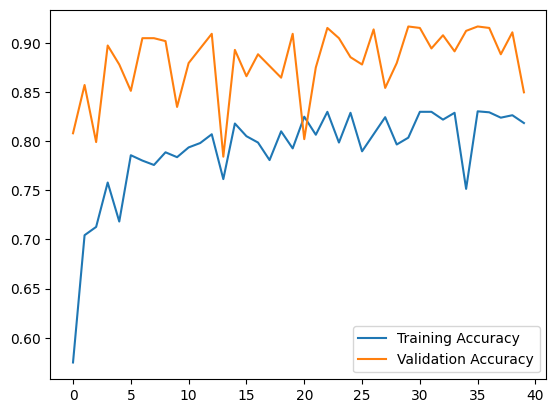

In [ ]:
# График функции потерь
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()

# График точности
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.show()

In [ ]:
model_fully_drop.load_weights("binary_fully_dropout_best.hdf5")

Посмотрим на предсказания модели

1/1 [==============================] - 0s 36ms/step


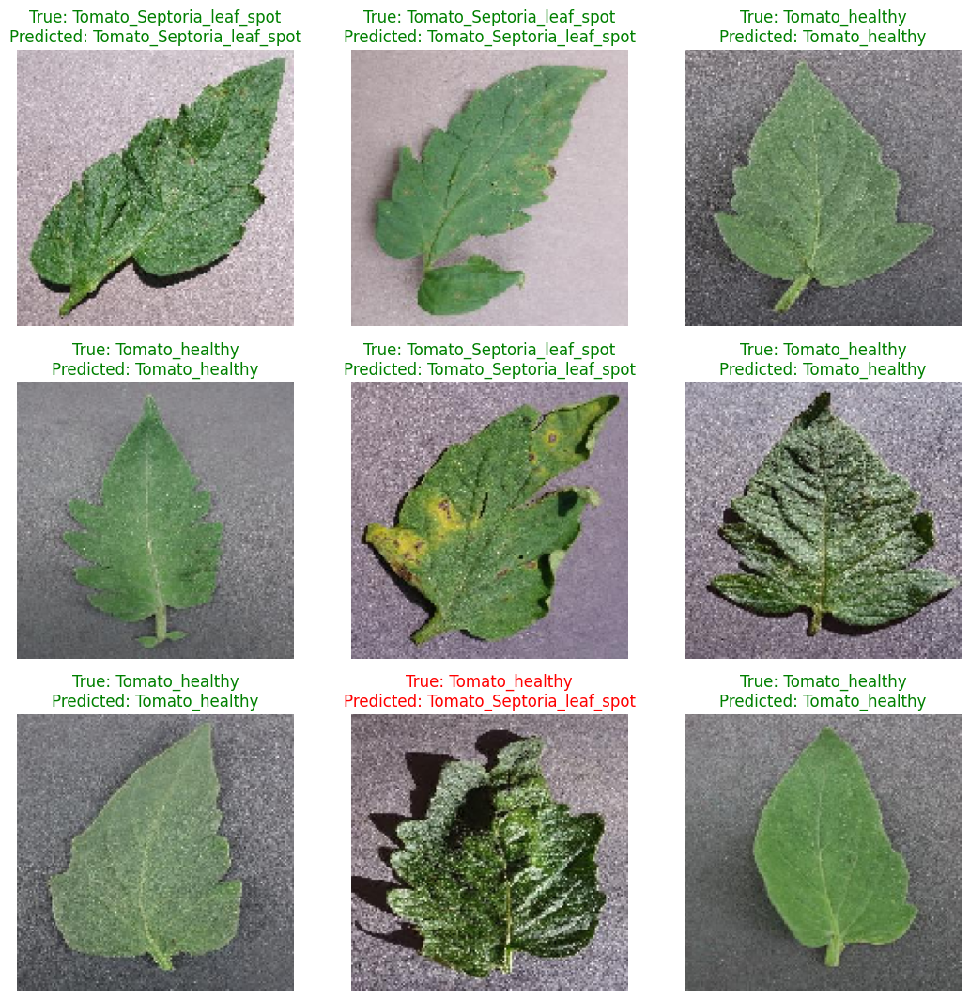

In [ ]:
# Получаем изображения и метки из тестового набора
test_images, test_labels = next(test_ds)

# Предсказываем метки для изображений с использованием лучшей модели
predictions = model_fully_drop.predict(test_images)

# Отображаем первые 9 изображений
plt.figure(figsize=(13, 13))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(test_images[i])
    true_label = 'Tomato_healthy' if test_labels[i] == 0 else 'Tomato_Septoria_leaf_spot'
    predicted_label = 'Tomato_healthy' if predictions[i] < 0.5 else 'Tomato_Septoria_leaf_spot'
    text_color = 'green' if true_label == predicted_label else 'red'
    plt.title(f'True: {true_label}\nPredicted: {predicted_label}', color=text_color)
    plt.axis('off')

plt.show()

В целом данная модель довольно таки неплохо справляется с поставленной задачей. Аналогично предыдущей

### Проведем аугментацию данных

В процессе аугментации создаются новые варианты изображений на основе существующих данных, добавляя разнообразие и дополнительные примеры для обучения модели. Это позволяет модели лучше обобщаться и эффективнее обучаться, особенно если у вас есть ограниченное количество исходных данных.

In [ ]:
# Создаем генератор для аугментации данных
augmentation_gen = ImageDataGenerator(
    rescale=1/255.0,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Создаем новый генератор для обучения с аугментированными данными
augmented_train_ds = augmentation_gen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary',
    classes=['Tomato_healthy', 'Tomato_Septoria_leaf_spot'],
    shuffle=True,
    seed=42
)

Found 2016 images belonging to 2 classes.


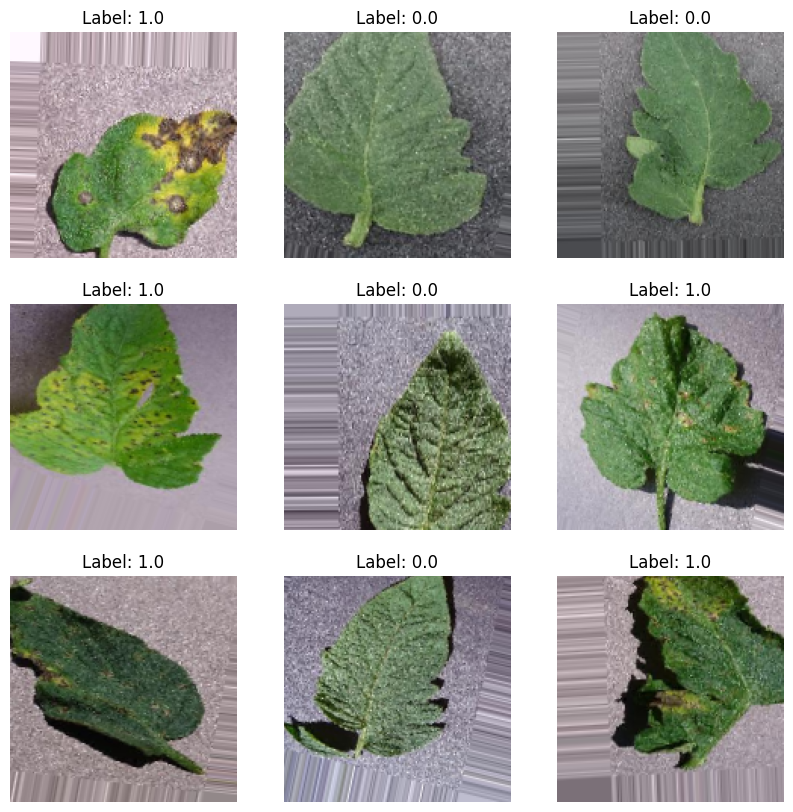

In [ ]:
# Load a few images from the test dataset
train_images, train_labels = next(augmented_train_ds)

# Display 9 images
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(train_images[i])
    plt.title(f"Label: {train_labels[i]}")
    plt.axis("off")
plt.show()

In [ ]:
model_aug = Sequential()

model_aug.add(Conv2D(4, (3, 3), activation='relu', input_shape=(150, 150, 3)))
model_aug.add(MaxPooling2D((2, 2)))

model_aug.add(Conv2D(8, (3, 3), activation='relu'))
model_aug.add(MaxPooling2D((2, 2)))

model_aug.add(Conv2D(8, (3, 3), activation='relu'))
model_aug.add(MaxPooling2D((2, 2)))

model_aug.add(Conv2D(8, (3, 3), activation='relu'))
model_aug.add(MaxPooling2D((2, 2)))

model_aug.add(Flatten())
model_aug.add(Dense(16, activation='relu'))
model_aug.add(Dense(1, activation='sigmoid'))

In [ ]:
model_aug.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
model_aug.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 148, 148, 4)       112       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 74, 74, 4)         0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 72, 72, 8)         296       
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 36, 36, 8)         0         
 g2D)                                                            
                                                                 
 conv2d_6 (Conv2D)           (None, 34, 34, 8)         584       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 17, 17, 8)        

Для если не будет никаких изменений валидационной точности в течении 10 эпох, то остановим обучение

In [ ]:
early_stop = EarlyStopping(monitor='val_accuracy',
                           patience=10,
                           mode='max',
                           verbose=1
                           )
checkpoint = ModelCheckpoint('binary_aug_best.hdf5',
                             monitor='val_accuracy',
                             verbose=1,
                             mode='max',
                             save_best_only=True
                             )

callbacks_list=[early_stop, checkpoint]

In [ ]:
epochs = 100
history = model_aug.fit(augmented_train_ds,
                    validation_data=val_ds,
                    epochs=epochs,
                    callbacks=callbacks_list)

Epoch 1/100
63/63 [==============================] - ETA: 0s - loss: 0.6871 - accuracy: 0.5362
Epoch 1: val_accuracy improved from -inf to 0.64286, saving model to binary_aug_best.hdf5
63/63 [==============================] - 22s 329ms/step - loss: 0.6871 - accuracy: 0.5362 - val_loss: 0.6467 - val_accuracy: 0.6429
Epoch 2/100
63/63 [==============================] - ETA: 0s - loss: 0.5272 - accuracy: 0.7406
Epoch 2: val_accuracy improved from 0.64286 to 0.91815, saving model to binary_aug_best.hdf5
63/63 [==============================] - 21s 326ms/step - loss: 0.5272 - accuracy: 0.7406 - val_loss: 0.2484 - val_accuracy: 0.9182
Epoch 3/100
63/63 [==============================] - ETA: 0s - loss: 0.2960 - accuracy: 0.8824
Epoch 3: val_accuracy improved from 0.91815 to 0.95685, saving model to binary_aug_best.hdf5
63/63 [==============================] - 22s 351ms/step - loss: 0.2960 - accuracy: 0.8824 - val_loss: 0.1486 - val_accuracy: 0.9568
Epoch 4/100
63/63 [========================

Визуализируем результаты

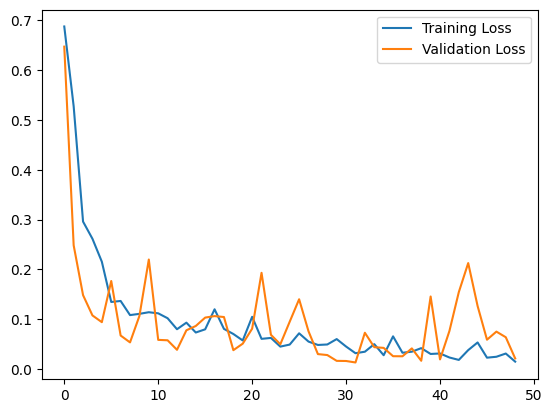

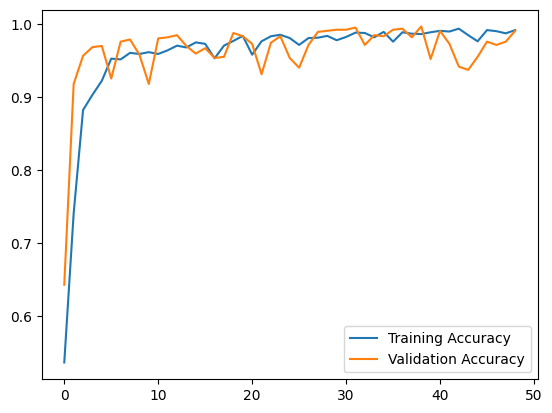

In [90]:
# График функции потерь
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()

# График точности
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.show()

In [91]:
model_aug.load_weights("binary_aug_best.hdf5")

1/1 [==============================] - 0s 80ms/step


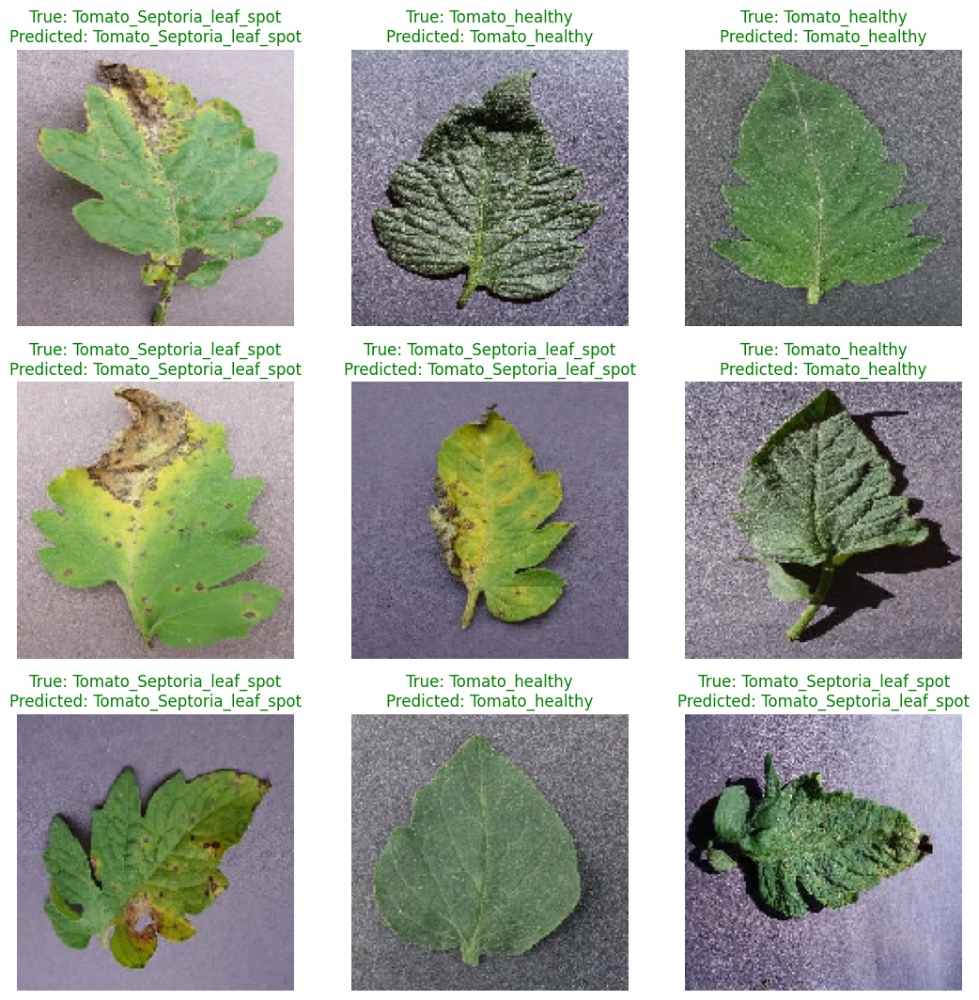

In [93]:
# Получаем изображения и метки из тестового набора
test_images, test_labels = next(test_ds)

# Предсказываем метки для изображений с использованием лучшей модели
predictions = model_aug.predict(test_images)

# Отображаем первые 9 изображений
plt.figure(figsize=(13, 13))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(test_images[i])
    true_label = 'Tomato_healthy' if test_labels[i] == 0 else 'Tomato_Septoria_leaf_spot'
    predicted_label = 'Tomato_healthy' if predictions[i] < 0.5 else 'Tomato_Septoria_leaf_spot'
    text_color = 'green' if true_label == predicted_label else 'red'
    plt.title(f'True: {true_label}\nPredicted: {predicted_label}', color=text_color)
    plt.axis('off')

plt.show()

## Мультиклассовая классификация

Выполним то же самое распределение по папкам, что и при бинарной классификации

In [94]:
os.makedirs(os.path.join("/content/multi", "Tomato_healthy"), exist_ok=True)
os.makedirs(os.path.join("/content/multi", "Tomato_Septoria_leaf_spot"), exist_ok=True)
os.makedirs(os.path.join("/content/multi", "Tomato__Tomato_YellowLeaf__Curl_Virus"), exist_ok=True)

In [95]:
source_dir = os.path.join(data_dir, "Tomato_healthy")
for filename in os.listdir(source_dir):
    source_file = os.path.join(source_dir, filename)
    destination_file = os.path.join("/content/multi/Tomato_healthy", filename)
    shutil.copy(source_file, destination_file)

source_dir = os.path.join(data_dir, "Tomato_Septoria_leaf_spot")
for filename in os.listdir(source_dir):
    source_file = os.path.join(source_dir, filename)
    destination_file = os.path.join("/content/multi/Tomato_Septoria_leaf_spot", filename)
    shutil.copy(source_file, destination_file)

source_dir = os.path.join(data_dir, "Tomato__Tomato_YellowLeaf__Curl_Virus")
for filename in os.listdir(source_dir):
    source_file = os.path.join(source_dir, filename)
    destination_file = os.path.join("/content/multi/Tomato__Tomato_YellowLeaf__Curl_Virus", filename)
    shutil.copy(source_file, destination_file)

Разделим выборку на train, val, test

In [96]:
file_path = "/content/multi"
splitfolders.ratio(file_path, output="./out_multi",
                   seed=333,
                   ratio=(0.6, 0.2, 0.2))

Copying files: 6571 files [00:01, 4772.82 files/s]


Пути к выборкам

In [97]:
train_dir = "/content/out_multi/train"
val_dir = "/content/out_multi/val"
test_dir = "/content/out_multi/test"

### Предобработка изображений

- Создаем объекты ImageDataGenerator, а также масштабируем изображение так, чтобы значения их пикселей были нормализованы между 0 и 1.
-  Загружаем изображения из какалога тестовой и валидационной выборки, размер изменен до 150х150px.
- Размер батча - количество образцов, которые будут распространяться по сети в данный момент времени

In [98]:
tr_gen = ImageDataGenerator(rescale=1/255.0)
v_gen = ImageDataGenerator(rescale=1/255.0)
t_gen = ImageDataGenerator(rescale=1/255.0)

# Load and iterate train dataset
train_ds = tr_gen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=32,
        class_mode='categorical',
        classes=['Tomato_healthy', 'Tomato_Septoria_leaf_spot', 'Tomato__Tomato_YellowLeaf__Curl_Virus'],
        shuffle=True,
        seed=42)

# Load and iterate validation dataset
val_ds = v_gen.flow_from_directory(val_dir,
                                   class_mode='categorical',
                                   target_size=(150, 150),
                                   batch_size=32,
                                   classes=['Tomato_healthy', 'Tomato_Septoria_leaf_spot', 'Tomato__Tomato_YellowLeaf__Curl_Virus'],
                                   shuffle=True,
                                   seed=42)
# Load and iterate test dataset
test_ds = t_gen.flow_from_directory(test_dir,
                                    class_mode='categorical',
                                    target_size=(150, 150),
                                    batch_size=32,
                                    classes=['Tomato_healthy', 'Tomato_Septoria_leaf_spot', 'Tomato__Tomato_YellowLeaf__Curl_Virus'],
                                    shuffle=True,
                                    seed=42)

Found 3940 images belonging to 3 classes.
Found 1313 images belonging to 3 classes.
Found 1317 images belonging to 3 classes.


Отобразим несколько изображений

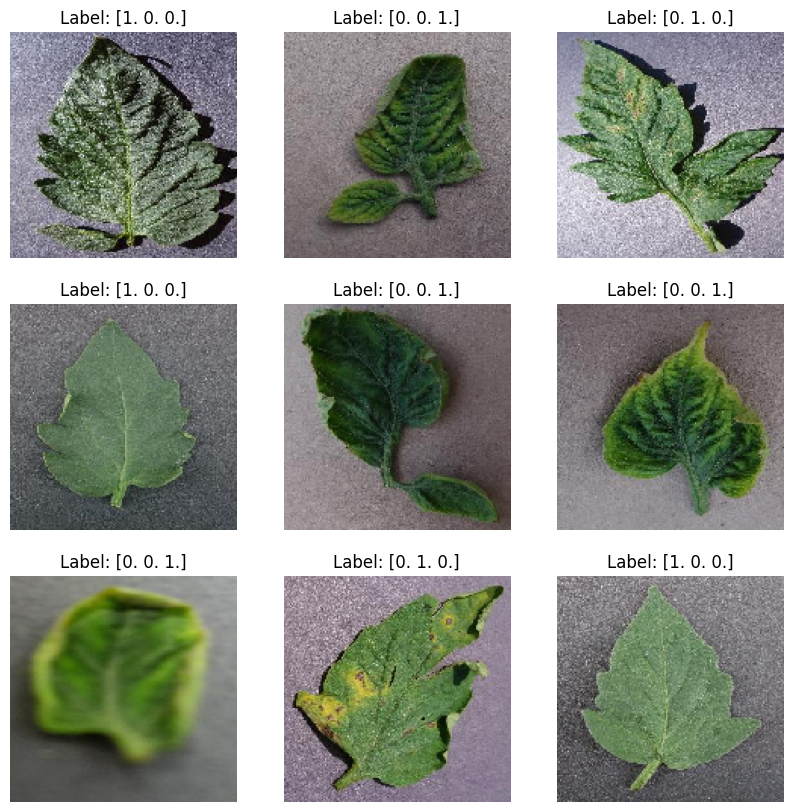

In [99]:
test_images, test_labels = next(test_ds)

# Display 9 images
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(test_images[i])
    plt.title(f"Label: {test_labels[i]}")
    plt.axis("off")
plt.show()

### Создадим нейросеть, используя предобученные модели

### ResNet

In [100]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D

Загрузка предварительно обученной модели ResNet50 без верхних полносвязных слоев

In [101]:
resnet_model = ResNet50(weights="imagenet", include_top=False, input_shape=(150, 150, 3))

94765736/94765736 [==============================] - 0s 0us/step


Замораживание весов сверточной основы в предварительно обученных моделях, таких как ResNet, является общей практикой в передаточном обучении (transfer learning). Замораживание весов означает, что веса этих слоев остаются неизменными в процессе обучения на новой задаче

In [102]:
for layer in resnet_model.layers:
    layer.trainable = False

In [103]:
model = Sequential()
model.add(resnet_model)
model.add(GlobalAveragePooling2D())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(3, activation='softmax'))

In [104]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [105]:
model.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 5, 5, 2048)        23587712  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense_28 (Dense)            (None, 256)               524544    
                                                                 
 dropout_9 (Dropout)         (None, 256)               0         
                                                                 
 dense_29 (Dense)            (None, 3)                 771       
                                                                 
Total params: 24113027 (91.98 MB)
Trainable params: 525315 (2.00 MB)
Non-trainable params: 23587712 (89.98 MB)
________

In [106]:
early_stop = EarlyStopping(monitor='val_accuracy',
                           patience=10,
                           mode='max',
                           verbose=1
                           )
checkpoint = ModelCheckpoint('multi_res_best.hdf5',
                             monitor='val_accuracy',
                             verbose=1,
                             mode='max',
                             save_best_only=True
                             )

callbacks_list=[early_stop, checkpoint]

In [107]:
epochs = 100
history = model.fit(train_ds,
                    validation_data=val_ds,
                    epochs=epochs,
                    callbacks=callbacks_list)

Epoch 1/100
124/124 [==============================] - ETA: 0s - loss: 1.0550 - accuracy: 0.4970
Epoch 1: val_accuracy improved from -inf to 0.54151, saving model to multi_res_best.hdf5
124/124 [==============================] - 312s 2s/step - loss: 1.0550 - accuracy: 0.4970 - val_loss: 0.9607 - val_accuracy: 0.5415
Epoch 2/100
124/124 [==============================] - ETA: 0s - loss: 0.9449 - accuracy: 0.5827
Epoch 2: val_accuracy improved from 0.54151 to 0.58492, saving model to multi_res_best.hdf5
124/124 [==============================] - 306s 2s/step - loss: 0.9449 - accuracy: 0.5827 - val_loss: 0.9220 - val_accuracy: 0.5849
Epoch 3/100
124/124 [==============================] - ETA: 0s - loss: 0.9005 - accuracy: 0.6145
Epoch 3: val_accuracy improved from 0.58492 to 0.62376, saving model to multi_res_best.hdf5
124/124 [==============================] - 305s 2s/step - loss: 0.9005 - accuracy: 0.6145 - val_loss: 0.8740 - val_accuracy: 0.6238
Epoch 4/100
124/124 [===================

In [1]:
# График функции потерь
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()

# График точности
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.show()

NameError: ignored

In [ ]:
model.load_weights("multi_res_best.hdf5")

In [ ]:
class_labels = ['Tomato_healthy', 'Tomato_Septoria_leaf_spot', 'Tomato__Tomato_YellowLeaf__Curl_Virus']

Визуализируем предсказание модели

1/1 [==============================] - 0s 44ms/step


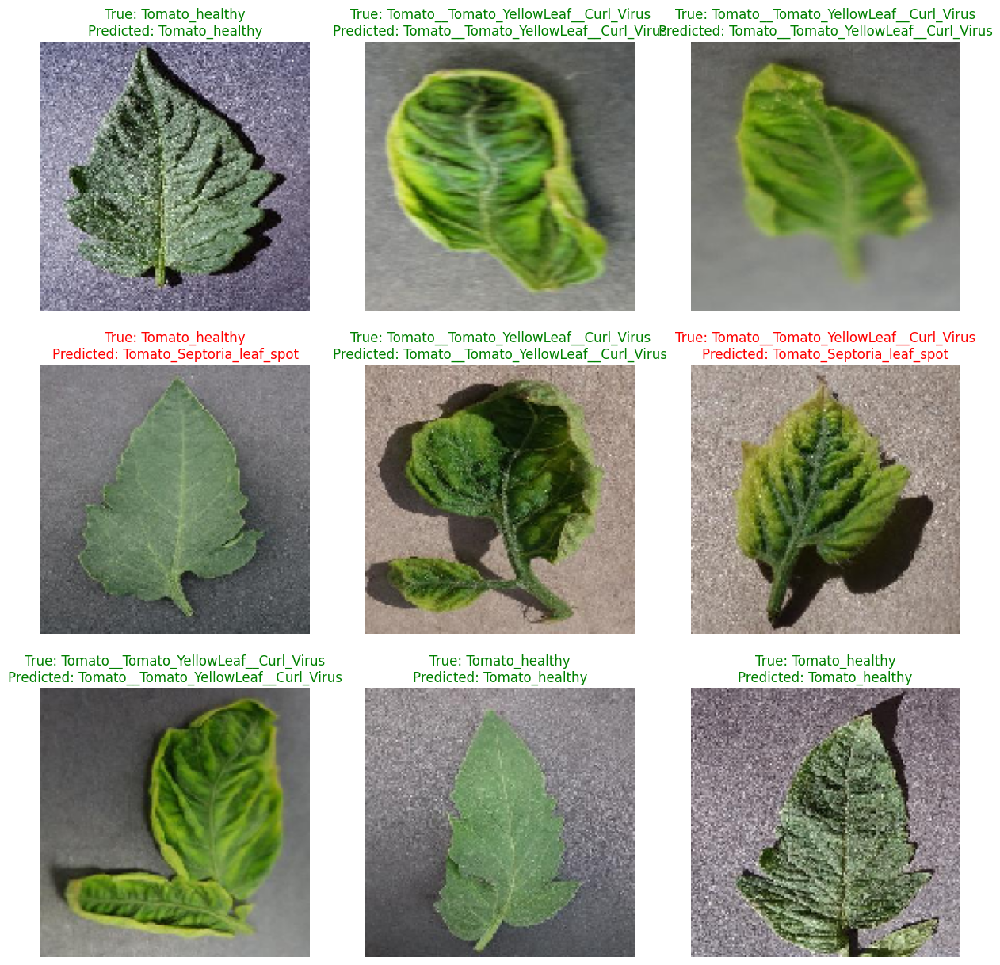

In [ ]:
# Получаем изображения и метки из тестового набора
test_images, test_labels = next(test_ds)

# Предсказываем метки для изображений с использованием лучшей модели
predictions = model.predict(test_images)

# Отображаем первые 9 изображений
plt.figure(figsize=(15, 15))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(test_images[i])

    true_label = class_labels[np.argmax(test_labels[i])]
    predicted_label = class_labels[np.argmax(predictions[i])]

    # Выбираем цвет текста в зависимости от верности предсказания
    text_color = 'green' if true_label == predicted_label else 'red'

    plt.title(f'True: {true_label}\nPredicted: {predicted_label}', color=text_color)
    plt.axis('off')

Обучение модели с fine-tuning

Размораживаем все слои для fine-tuning

In [ ]:
for layer in model.layers:
    layer.trainable = True

Пересоздаем модель с измененными trainable параметрами

In [ ]:
model.compile(optimizer="adam", loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
early_stop = EarlyStopping(monitor='val_accuracy',
                           patience=10,
                           mode='max',
                           verbose=1
                           )
checkpoint = ModelCheckpoint('multi_res_best_ft.hdf5',
                             monitor='val_accuracy',
                             verbose=1,
                             mode='max',
                             save_best_only=True
                             )

callbacks_list=[early_stop, checkpoint]

In [ ]:
epochs = 100
history_finetune = model.fit(train_ds,
                    validation_data=val_ds,
                    epochs=epochs,
                    callbacks=callbacks_list)

Epoch 1/100
124/124 [==============================] - ETA: 0s - loss: 5.7864 - accuracy: 0.8820
Epoch 1: val_accuracy improved from -inf to 0.24219, saving model to multi_res_best_ft.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


124/124 [==============================] - 71s 280ms/step - loss: 5.7864 - accuracy: 0.8820 - val_loss: 3921141.0000 - val_accuracy: 0.2422
Epoch 2/100
124/124 [==============================] - ETA: 0s - loss: 1.5584 - accuracy: 0.8551
Epoch 2: val_accuracy improved from 0.24219 to 0.26961, saving model to multi_res_best_ft.hdf5
124/124 [==============================] - 29s 231ms/step - loss: 1.5584 - accuracy: 0.8551 - val_loss: 8.8836 - val_accuracy: 0.2696
Epoch 3/100
124/124 [==============================] - ETA: 0s - loss: 0.2800 - accuracy: 0.9396
Epoch 3: val_accuracy improved from 0.26961 to 0.48819, saving model to multi_res_best_ft.hdf5
124/124 [==============================] - 29s 236ms/step - loss: 0.2800 - accuracy: 0.9396 - val_loss: 5.4137 - val_accuracy: 0.4882
Epoch 4/100
124/124 [==============================] - ETA: 0s - loss: 0.2335 - accuracy: 0.9574
Epoch 4: val_accuracy did not improve from 0.48819
124/124 [==============================] - 28s 225ms/step - 

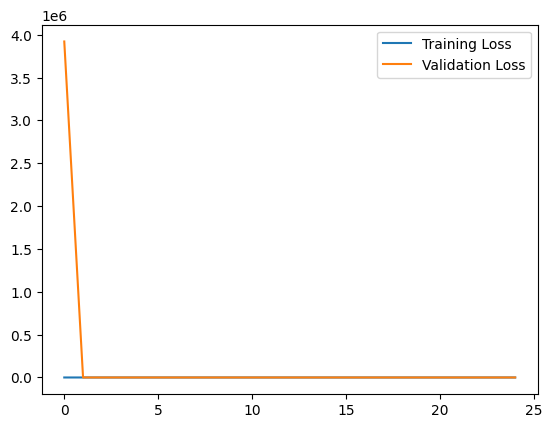

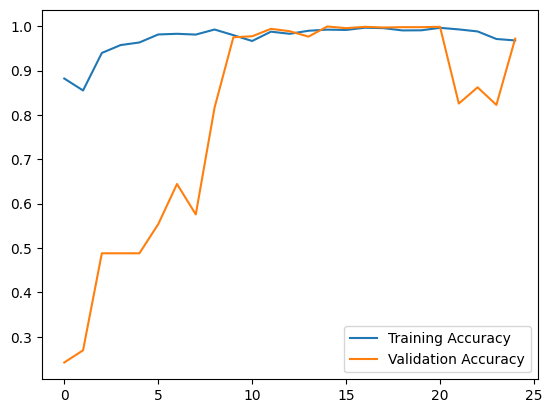

In [ ]:
# График функции потерь
plt.plot(history_finetune.history['loss'], label='Training Loss')
plt.plot(history_finetune.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()

# График точности
plt.plot(history_finetune.history['accuracy'], label='Training Accuracy')
plt.plot(history_finetune.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.show()

In [ ]:
model.load_weights("multi_res_best_ft.hdf5")

Визуализируем предсказание модели

1/1 [==============================] - 1s 985ms/step


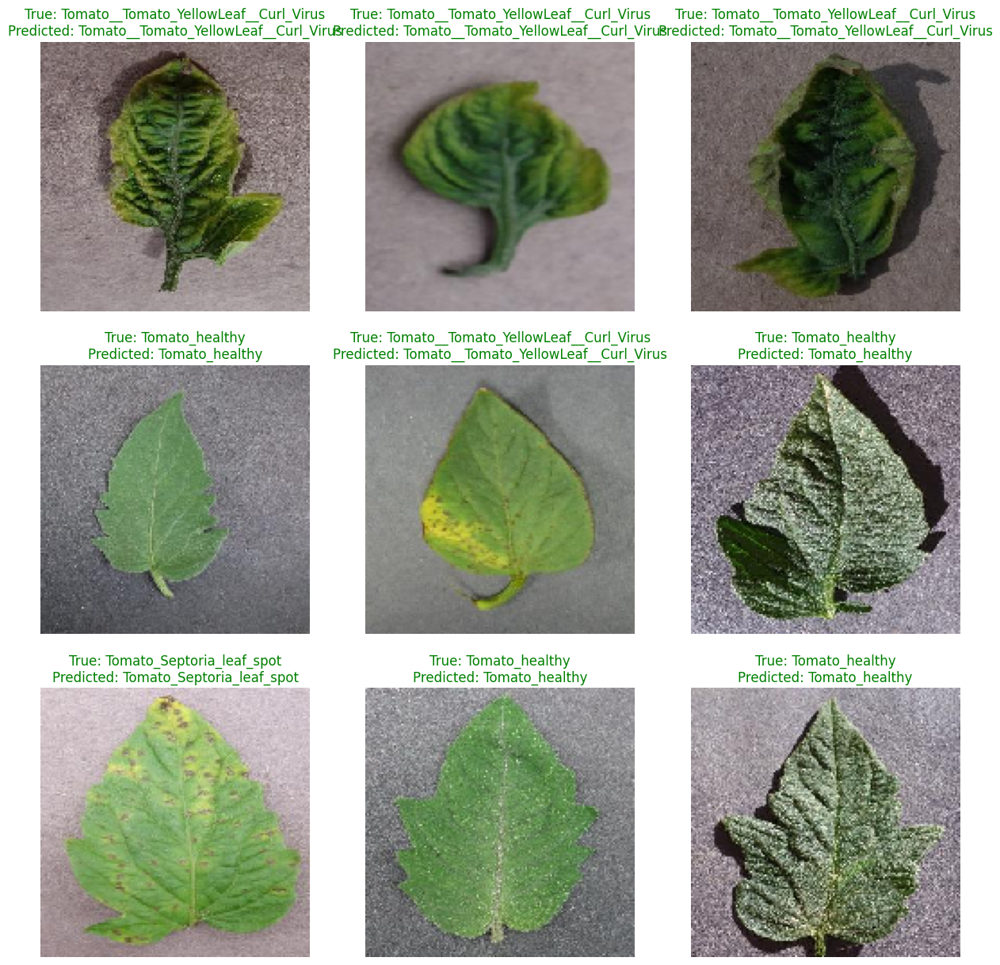

In [ ]:
# Получаем изображения и метки из тестового набора
test_images, test_labels = next(test_ds)

# Предсказываем метки для изображений с использованием лучшей модели
predictions = model.predict(test_images)

# Отображаем первые 9 изображений
plt.figure(figsize=(15, 15))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(test_images[i])

    true_label = class_labels[np.argmax(test_labels[i])]
    predicted_label = class_labels[np.argmax(predictions[i])]

    # Выбираем цвет текста в зависимости от верности предсказания
    text_color = 'green' if true_label == predicted_label else 'red'

    plt.title(f'True: {true_label}\nPredicted: {predicted_label}', color=text_color)
    plt.axis('off')

Предсказания получаются слишком идеальными, т.к. было "разморожено" не определенное количество слоев, а все. Но в любом случае я предполагаю, что fine tuning модели улучшил бы ее предсказательную способность